# Visualization Guidelines

In [ ]:
import matplotlib.pyplot as plt # traditional import
import numpy as np
import pandas as pd
import cartopy
import cmocean.cm as cmo
import xarray as xr

import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
from matplotlib import cm, colors


In [2]:
# !mamba install -c conda-forge geoviews -y

In [3]:
# !mamba install -c conda-forge hvplot -y

In [4]:
# !mamba install -c conda-forge wget -y

In [5]:
# !mamba install -c conda-forge cmocean -y

In [6]:
# !mamba install -c conda-forge cartopy -y

In [7]:
# !mamba install -c conda-forge pooch -y

# This Tutorial

## Learning Objectives

* Know what makes a complete plot.
* Be able to select the type of plot that makes sense for a given plotting goal of some number of variables.
* Be able to choose a plot-appropriate colormap that isn't just the default (necessarily).
* Know why plotting on the Earth requires special handling.

## Target Audience

From little to no plotting experience on up — focus on the visualization principles and guidance. You'll have my code to follow if/when you want to play with any of the plotting code. I am most familiar with `matplotlib` so most of my plots are using it but we are not focusing on plot code syntax.

I recommend following along with me in this tutorial, watching me but also having it ready on your own screen so you can try things out if you want — but the examples will all be available for you for later so no need to memorize anything. It will be more interesting for you if you follow the discussion instead of scrolling ahead.

## Me

* PhD UW in Mechanical Engineering doing tidal turbine siting in Admiralty Inlet with ocean model software ROMS.
* Post doc, research scientist, and research professor at Texas A&M in Oceanography doing particle tracking in model for application to oil spills, and deep dive into Python and the scientific Python community (SciPy was in Austin at that time).
* Now at Axiom Data Science doing similar work but in industry — scientific software for ocean modeling and data

kthyng@gmail.com, @kthyng on github

# Line Plots

The humble line plot should be done well.


## Get some data


But first let's get some data. I found this by googling "CTD Seattle" and clicking around until I got a link that looked like I could use directly.

This is CTD data taken twice a month in Lake Washington. It has multiple variables at time in depth.

Data link: https://data.kingcounty.gov/Environment-Waste-Management/Freshwater-CTD-data/nrpy-ni8p/about_data

In [8]:
url = "https://data.kingcounty.gov/api/views/nrpy-ni8p/rows.csv?accessType=DOWNLOAD"
df = pd.read_csv(url, parse_dates=["CollectDateTime"]).pivot(index=["CollectDateTime", "Depth"], columns='ParmDisplayName', values='Value')

df

ParmDisplayName             Beam Transmission  Chlorophyll, Field  \
CollectDateTime     Depth                                           
2017-01-09 09:02:24 0.510             17.4581              0.6550   
                    1.020             83.9491              1.4792   
                    1.530             86.2370              1.3815   
                    2.039             85.8336              1.4991   
                    2.549             85.8997              1.4431   
...                                       ...                 ...   
2025-07-28 11:42:21 23.000            90.2734              0.3194   
                    23.500            90.1178              0.3081   
                    24.000            89.6297              0.2987   
                    24.500            90.0189              0.2953   
                    25.000            90.2834              0.3016   

ParmDisplayName             Conductivity, Field  Conductivity, Raw  \
CollectDateTime     Depth                                            
2017-01-09 09:02:24 0.510                98.243             0.0062   
                    1.020                97.499             0.0062   
                    1.530                97.769             0.0062   
                    2.039                97.642             0.0062   
                    2.549                97.681             0.0062   
...                                         ...                ...   
2025-07-28 11:42:21 23.000              114.521             0.0078   
                    23.500              114.540             0.0078   
                    24.000              114.624             0.0078   
                    24.500              114.777             0.0078   
                    25.000              114.935             0.0078   

ParmDisplayName             Dissolved Oxygen, Field       PAR  Salinity  \
CollectDateTime     Depth                                                 
2017-01-09 09:02:24 0.510                   12.5670  123.4400    0.0446   
                    1.020                    9.3221   48.8520    0.0443   
                    1.530                   11.9593   35.3160    0.0444   
                    2.039                   10.8664   30.2040    0.0443   
                    2.549                   10.8638   24.1290    0.0443   
...                                             ...       ...       ...   
2025-07-28 11:42:21 23.000                   8.0099    0.0018    0.0534   
                    23.500                   8.0797    0.0018    0.0533   
                    24.000                   8.1075    0.0018    0.0533   
                    24.500                   7.9552    0.0018    0.0533   
                    25.000                   7.6768    0.0018    0.0534   

ParmDisplayName             Surface PAR  Temperature  
CollectDateTime     Depth                             
2017-01-09 09:02:24 0.510           NaN       6.5634  
                    1.020           NaN       6.5617  
                    1.530           NaN       6.5636  
                    2.039           NaN       6.5614  
                    2.549           NaN       6.5646  
...                                 ...          ...  
2025-07-28 11:42:21 23.000       2342.7       9.2109  
                    23.500       2342.1       9.1272  
                    24.000       2342.0       9.0260  
                    24.500       2343.0       8.9136  
                    25.000       2343.4       8.8298  

[41507 rows x 9 columns]

How can this plot be improved?

<Axes: xlabel='CollectDateTime'>

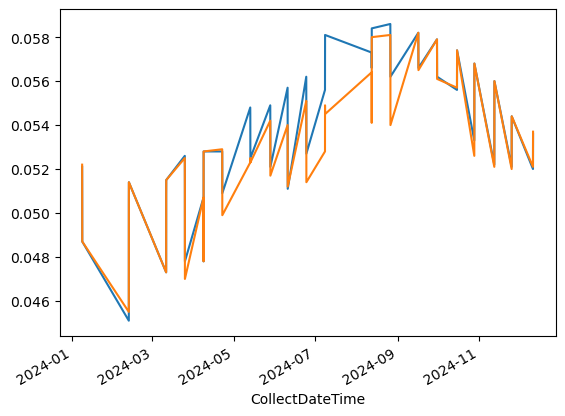

In [9]:
df["Salinity"].loc["2024", 1].plot(grid=True)
df["Salinity"].loc["2024", 10].plot()

## Axes Properties

* Line steepness — controlled by figure size. Aim for 45˚ to make the relationships in the lines most visible (Edward Tufte)
* Include labels and title(s)
* Include units
* Font sizes (title, ticks, ticklabels, labels)
* Font color
* legend
* Chart junk (grid if not necessary, shading, lines that aren't meaningful) (Edward Tufte)


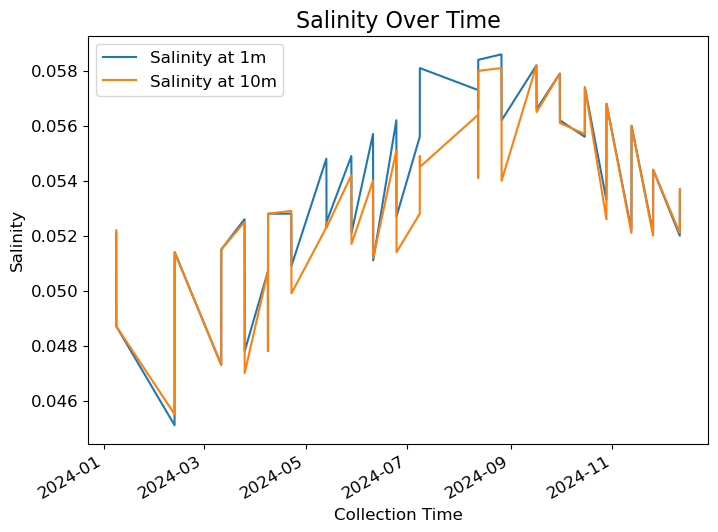

In [10]:
plt.figure(figsize=(8, 6))  # set figure size to control line steepness

df["Salinity"].loc['2024', 1].plot(grid=True)
df["Salinity"].loc['2024', 10].plot()

## Improve the plot

# add labels and title so we know what we're looking at
# Make sure fontsizes are big enough to read in a presentation
fs_text = 12
fs_title = 16
plt.xlabel('Collection Time', fontsize=fs_text)
plt.ylabel('Salinity', fontsize=fs_text)
plt.title('Salinity Over Time', fontsize=fs_title)
plt.tick_params(labelsize=fs_text)

# add a legend
plt.legend(['Salinity at 1m', 'Salinity at 10m'], fontsize=fs_text)

# turn off the grid since it is not very helpful here and it clutters the plot
plt.grid(False)

# # alternatively, we could use a grid that is less intrusive
# plt.grid(True, linestyle='--', alpha=0.5)


## Line properties

Things to consider:

* line width — use to differentiate lines or just make them all wider to be more visible
* line color — What colors look good together? Most tools default to decent selections now, but I like [this tool](https://htmlcolorcodes.com/color-picker/) for selecting the number of complementary colors I need for a plot when I'm doing an excellent plot.
* line style — Will someone print your plot in black and white? This enables distinguishing between two solid gray lines. Also can help make multiple lines visible when they overlap.
* transparency — usually called `alpha`


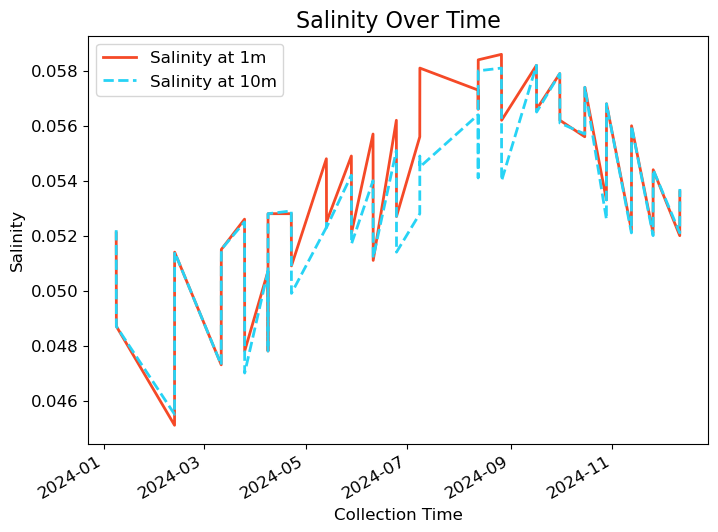

In [11]:
plt.figure(figsize=(8, 6))  # set figure size to control line steepness

lw = 2  # line width for better visibility
df["Salinity"].loc['2024', 1].plot(grid=True, linewidth=lw, color="#F54927", ls='-')
df["Salinity"].loc['2024', 10].plot(linewidth=lw, color="#27D3F5", ls='--')

# add labels and title so we know what we're looking at
# Make sure fontsizes are big enough to read in a presentation
fs_text = 12
fs_title = 16
plt.xlabel('Collection Time', fontsize=fs_text)
plt.ylabel('Salinity', fontsize=fs_text)
plt.title('Salinity Over Time', fontsize=fs_title)
plt.tick_params(labelsize=fs_text)

# add a legend
plt.legend(['Salinity at 1m', 'Salinity at 10m'], fontsize=fs_text)

# turn off the grid since it is not very helpful here and it clutters the plot
plt.grid(False)

# # alternatively, we could use a grid that is less intrusive
# plt.grid(True, linestyle='--', alpha=0.5)


## Summary

* Always include metadata for your figures: label your axes, add a title, include a legend (or colorbar for plots we'll see later). What does a viewer who hasn't seen your plot before need to know to understand it without you standing there to explain it?
* Make lines/plot elements easily visible even in a presentation to someone in the back of the room. Imagine if someone prints your plot in grayscale if it would turn out ok.

# Property-property plot

This is like a line plot but using markers instead of lines and is typically used for showing two variables together as opposed to one vs. time.

## 2 variables

Using the same data as the last section, let's look at a T-S diagram.

Text(0, 0.5, 'Temperature (°C)')

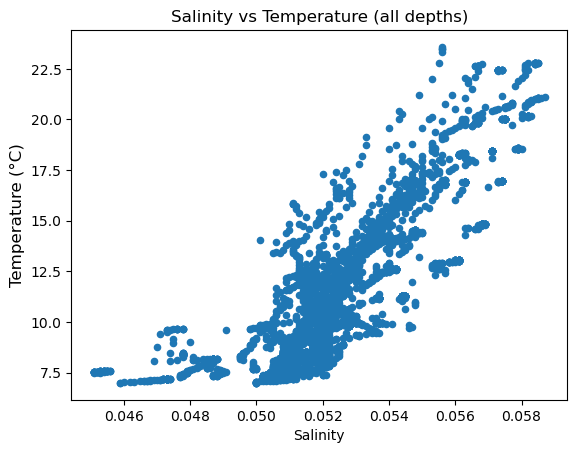

In [12]:
df.loc["2024"].plot(x="Salinity", y="Temperature", kind="scatter", title="Salinity vs Temperature (all depths)")
plt.gca().set_ylabel("Temperature (°C)", fontsize=fs_text)

## 3 variables

How do the temperature and salinity vary with depth?

Text(0, 0.5, 'Temperature (°C)')

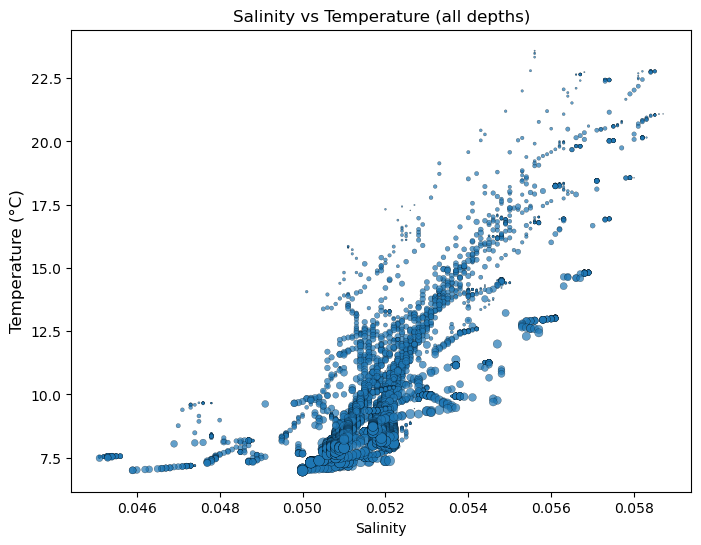

In [13]:
# have to reset index to create the depth column and then access it
df.loc["2024"].reset_index().plot(x="Salinity", y="Temperature", s="Depth", kind="scatter", figsize=(8, 6), 
                                  title="Salinity vs Temperature (all depths)",
                                  edgecolor='black', linewidth=0.2, alpha=0.7)
plt.gca().set_ylabel("Temperature (°C)", fontsize=fs_text)

## 4 variables

Add dissolved oxygen to understand how it co-varies with the rest.

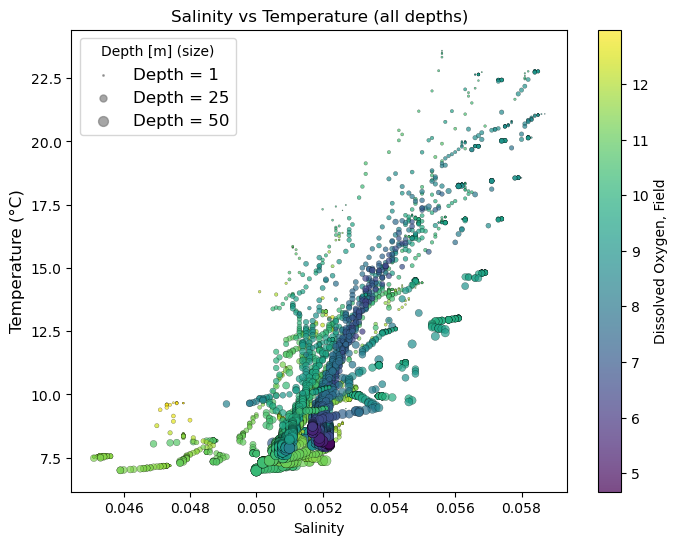

In [14]:
# have to reset index to create the depth column and then access it
df.loc["2024"].reset_index().plot(x="Salinity", y="Temperature", s="Depth", c="Dissolved Oxygen, Field", 
                                  kind="scatter", figsize=(8, 6), title="Salinity vs Temperature (all depths)",
                                  edgecolor='black', linewidth=0.2, alpha=0.7)
plt.gca().set_ylabel("Temperature (°C)", fontsize=fs_text)

# Add size legend for Depth
for size in [1, 25, 50]:  # example sizes to show
    plt.gca().scatter([], [], s=size, c="gray", alpha=0.7, label=f"Depth = {size}")

plt.gca().legend(title="Depth [m] (size)", loc="upper left", fontsize=fs_text)


## Summary

If you want to examine relationships between variables, you can plot with property-property plots. For 2 variables, you can simply plot with markers. For 3 variables, use color to represent another variable, and add a 4th with marker size. Be sure to include a legend and clear labels to keep everything comprehensible. 

# Gridded Plots

Plots made from data or model output that varies with two coordinates like longitude and latitude instead of only time or depth.


## Get some data

ROMS example data from xarray.

In [15]:
ds = xr.tutorial.open_dataset("ROMS_example")
ds

<xarray.Dataset> Size: 19MB
Dimensions:     (ocean_time: 2, s_rho: 30, eta_rho: 191, xi_rho: 371)
Coordinates:
    Cs_r        (s_rho) float64 240B ...
    lon_rho     (eta_rho, xi_rho) float64 567kB ...
    hc          float64 8B ...
    h           (eta_rho, xi_rho) float64 567kB ...
    lat_rho     (eta_rho, xi_rho) float64 567kB ...
    Vtransform  int32 4B ...
  * ocean_time  (ocean_time) datetime64[ns] 16B 2001-08-01 2001-08-08
  * s_rho       (s_rho) float64 240B -0.9833 -0.95 -0.9167 ... -0.05 -0.01667
Dimensions without coordinates: eta_rho, xi_rho
Data variables:
    salt        (ocean_time, s_rho, eta_rho, xi_rho) float32 17MB ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 567kB ...
Attributes: (12/34)
    file:              ../output_20yr_obc/2001/ocean_his_0015.nc
    format:            netCDF-4/HDF5 file
    Conventions:       CF-1.4
    type:              ROMS/TOMS history file
    title:             TXLA ROMS hindcast run with dyes and oxygen
    rst_file:          ../output_20yr_obc/2001/ocean_rst.nc
    ...                ...
    compiler_flags:    -heap-arrays -fp-model fast -mt_mpi -ip -O3 -msse2 -free
    tiling:            010x012
    history:           Tue Jul 24 11:04:43 2018: /opt/nco/ncks -D 4 -t 8 /cop...
    ana_file:          /home/d.kobashi/TXLA_ROMS_reana/Functionals/ana_btflux...
    CPP_options:       TXLA2, ANA_BPFLUX, ANA_BSFLUX, ANA_BTFLUX, ANA_NUDGCOE...
    NCO:               netCDF Operators version 4.7.6-alpha04 (Homepage = htt...

## Plot

The same principles generally apply for this sort of plot as for a line plot: labels, make things visible, use good colors, etc. But we also have to worry about there being more numbers to represent.

Any idea why this plot looks weird?

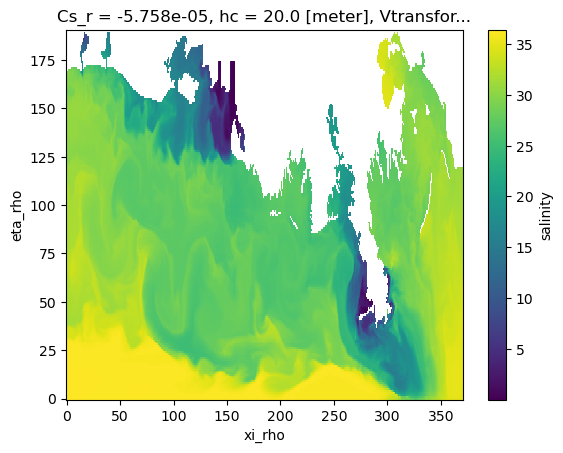

In [16]:
ds["salt"][0,-1].plot()

The coordinates are not 1d and need to be included:

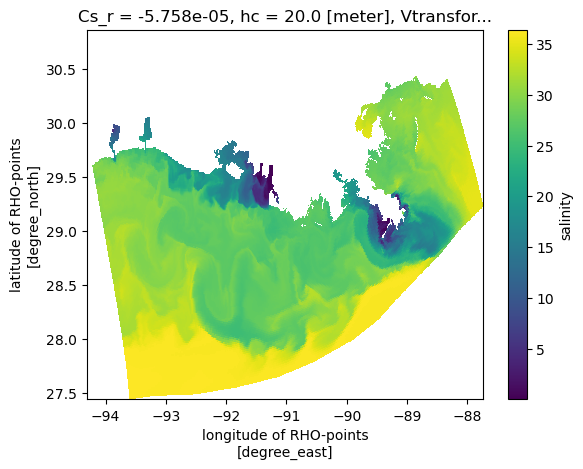

In [17]:
ds["salt"][0,-1].plot(x="lon_rho", y="lat_rho")

The aspect ratio is also off.

## Summary

When you have gridded data (as a matrix) you should plot appropriately and worry about using the correct coordinates if appropriate.

Other important issues are discussed next: colormaps and projections.

# Colormaps

Anything you represent values with color such as in the 3 or 4 variable property-property plots or a gridded plot, you should consider what colormap you use.

## Why should we care about colormaps?

What does this figure show?

![](figures/example_bad_cmap_low.png)

Rogowitz, B. E., & Treinish, L. A. (2009). Why should engineers and scientists be worried about color. See URL http://www. research. ibm. com/people/l/lloydt/color/color. HTM.

South-eastern US and Gulf of Mexico.

The colormap makes a big difference!

![](figures/example_good_cmap_low.png)

## Colormap properties

A colormap should:
* show equal changes across the data as equal changes across the colormap, as perceived by people
* be intuitive
* if colored, differentiate colors for color blindness
* if possible, look nice

This discussion is for colormaps represeting data that has values relative to each other. Like one value is larger or smaller than another. For plotting different categories you don't need to worry about many of the issues raised here and instead want to have colors that will be distinguishable from each other (i.e. plotting US states with a color representing the most popular fast food chain in the state).

## Perceptually uniform colormaps

Look at the column of "jet" plots. This rainbow colormap is problematic because it is not perceptually uniform. That means that when evaluated in a 3D colorspace that represents colors the way people perceive them (as opposed to e.g. RGB) the colormap will have jumps.

The impact of these jumps is visible in the plot of a cone (bottom two plots in the column). The data being plotted is perfectly smooth, but it looks like there are several distinct rings on the cone; the rings are just artifacts of the colormap. Imagine what this does when you are plotting brand new data and look for features using the jet colormap? Look back at your favorite papers using jet and see if the important feature that is being discussed is colored in yellow or cyan.

![](figures/cmapcomp5.jpg)

## The importance of lightness

People interpret spatial structure of data best when mapped by lightness, so use lightness strategically to show data.

### Sequential colormaps
Look back at the plot above. The `gray` and `haline` colormaps monotonically increase with lightness (3rd row down). Colormaps with this property should be used for representing that you want to show as incrementally increasing or decreasing that doesn't have a meaningful "center" you want to compare with, like amount of precipitation.

### Diverging colormaps
The `balance` colormap monotonically increases then decreases with lightness. This sort of map should be used for properties that represent anomalies around a critical value, like temperature anomaly.

### Cyclic colormaps
The data wraps in a circle like angles.

### Which colormap is better?

#### Sea surface temperature

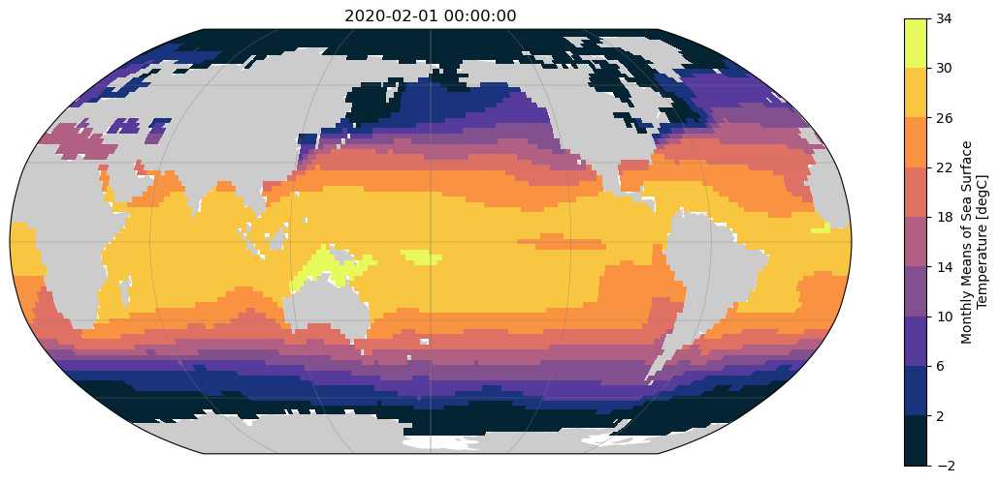

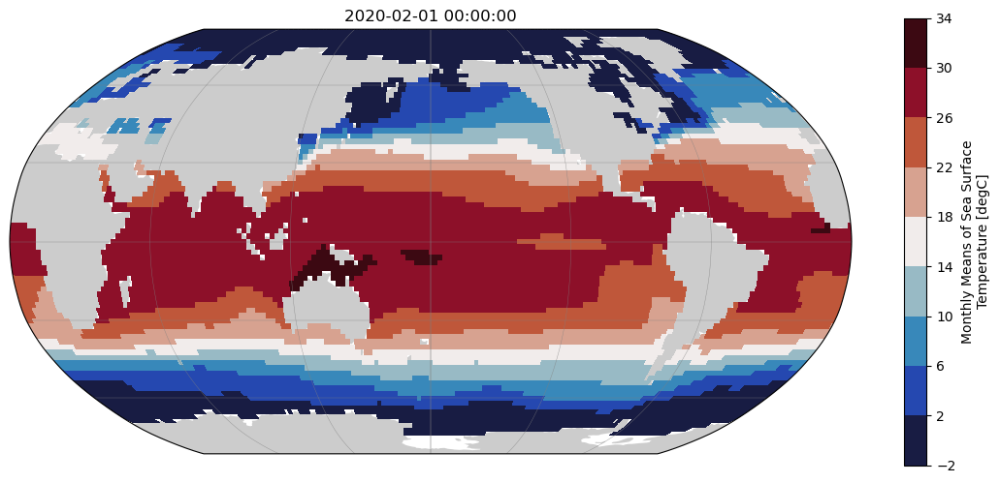

In [18]:

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

cmaps = [cmo.thermal, cmo.balance]

# Plot global temperature in 3 colormaps
loc = 'http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/noaa.ersst/sst.mnmean.v4.nc'
d = xr.open_dataset(loc)
proj = cartopy.crs.Robinson(central_longitude=180)

for cmap in cmaps:
    fig = plt.figure(figsize=(14,6))
    ax = fig.add_subplot(111, projection=proj)
    ax.add_feature(cartopy.feature.LAND, facecolor='0.8')
    d['sst'].isel(time=-1).plot(x="lon", y="lat", cmap=cmap, vmin=-2, vmax=34, 
                                transform=cartopy.crs.PlateCarree(), levels=np.arange(-2, 35, 4))
    ax.gridlines(linewidth=0.3, color='gray', alpha=0.8, linestyle='-')
    ax.set_title(pd.Timestamp(d['time'].isel(time=-1).values).strftime('%Y-%m-%d %H:%M:%S'))


# 

#### Sea surface height

In [19]:
!wget https://gcoos5.geos.tamu.edu/erddap/files/SSH_GoA_2009/2009.nc

--2025-08-15 11:21:58--  https://gcoos5.geos.tamu.edu/erddap/files/SSH_GoA_2009/2009.nc
Resolving gcoos5.geos.tamu.edu (gcoos5.geos.tamu.edu)... 128.194.19.114
Connecting to gcoos5.geos.tamu.edu (gcoos5.geos.tamu.edu)|128.194.19.114|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 28050752 (27M) [application/x-netcdf]
Saving to: ‘2009.nc.1’

2009.nc.1           100%[===================>]  26.75M  8.31MB/s    in 3.2s    

2025-08-15 11:22:02 (8.31 MB/s) - ‘2009.nc.1’ saved [28050752/28050752]



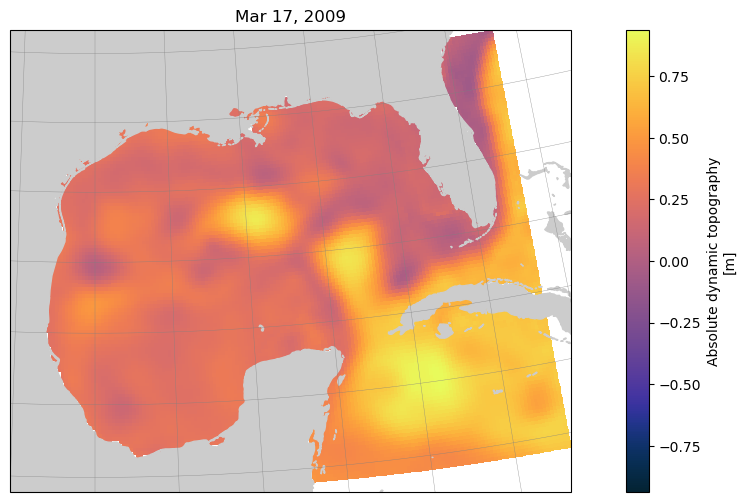

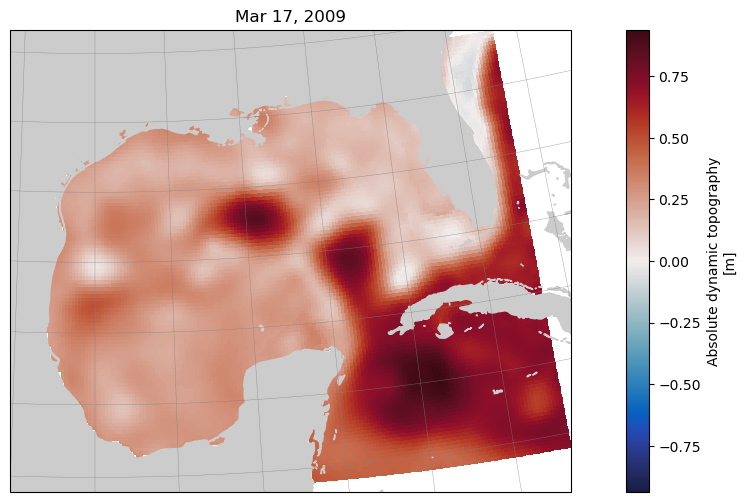

In [20]:
# Plot sea surface height
# http://www.gcoos.org/products/index.php/model-resources/ssha/
loc = '2009.nc'
d = xr.open_dataset(loc)
proj = cartopy.crs.LambertConformal()
l10 = cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        edgecolor='face',
                                        facecolor='0.8')

itime = 75
for cmap in cmaps:
    fig = plt.figure(figsize=(14,6))
    ax = fig.add_subplot(111, projection=proj)
    # ax.add_feature(cartopy.feature.LAND, facecolor='0.8')
    ax.add_feature(l10)
    d['adt'].isel(time=itime).plot(x="longitude", y="latitude", cmap=cmap, center=0,
                                transform=cartopy.crs.PlateCarree(), )
    ax.gridlines(linewidth=0.3, color='gray', alpha=0.8, linestyle='-')
    ax.set_title(pd.Timestamp(d.time[itime].values).strftime('%b %d, %Y'))


#### Tidal phase

Cyclic colormap anti-example (couldn't find data to use in a reasonable amount of time, so showing an old plot fail of mine).

![](figures/k1phuvbar.png)

## Colormap usage example

Grab data from a cruise transect in the Puget Sound, taking CTD casts from the ship periodically.

Our goal is the plot the data with different colormaps to see the difference.

![](https://nvs.nanoos.org/local/apps/CruiseSalish/images/plot_transect-main_basin.png)

In [21]:
# https://nvs.nanoos.org/CruiseSalish

import requests
import zipfile
import io
import pandas as pd

# got this link by opening "developer tools" in the browser and looking at the network tab while downloading the file
zip_path = "https://nvs.nanoos.org/local/apps/CruiseSalish/data/Salish_Cruise-1998_June-Data.zip"
file_inside_zip = "SalishCruise_June1998_downcast.csv"
r = requests.get(zip_path)
r.raise_for_status()

with zipfile.ZipFile(io.BytesIO(r.content)) as z:
    with z.open(file_inside_zip) as f:
        df = pd.read_csv(f, header=0, skiprows=[1,2], parse_dates=["UTC Time"])

# add temperature anomaly
df["Temperature anomaly"] = df["Temperature"] - df["Temperature"].mean()

df

,Cruise ID,UTC Time,Latitude DegMin,Longitude DegMin,Latitude Deg,Longitude Deg,Station,Pressure,Depth,Temperature,Salinity,Sigma-t,Oxygen Concentration MG,Oxygen Concentration MG.1,Chlorophyll Fluorescence,Beam Transmission,Temperature anomaly
0,TN079,1998-06-16 04:41:34,48 0.96 N,122 18.24 W,48.016,-122.304,P1,3.0,2.98,14.29,24.28,17.87,7.98,12.36,6.42,71.66,3.622259
1,TN079,1998-06-16 04:41:34,48 0.96 N,122 18.24 W,48.016,-122.304,P1,3.5,3.47,14.28,24.30,17.88,8.00,12.39,6.81,71.66,3.612259
2,TN079,1998-06-16 04:41:34,48 0.96 N,122 18.24 W,48.016,-122.304,P1,4.0,3.97,14.28,24.29,17.88,8.00,12.39,6.53,71.78,3.612259
3,TN079,1998-06-16 04:41:34,48 0.96 N,122 18.24 W,48.016,-122.304,P1,4.5,4.46,14.28,24.30,17.88,7.98,12.36,6.58,71.67,3.612259
4,TN079,1998-06-16 04:41:34,48 0.96 N,122 18.24 W,48.016,-122.304,P1,5.0,4.96,14.25,24.33,17.91,7.98,12.36,6.63,71.83,3.582259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9838,TN079,1998-06-19 10:59:52,47 24.96 N,122 31.56 W,47.416,-122.526,P39,112.0,111.04,10.92,29.29,22.35,7.76,11.98,0.97,80.59,0.252259
9839,TN079,1998-06-19 10:59:52,47 24.96 N,122 31.56 W,47.416,-122.526,P39,112.5,111.53,10.92,29.29,22.35,7.77,12.01,1.87,81.21,0.252259
9840,TN079,1998-06-19 10:59:52,47 24.96 N,122 31.56 W,47.416,-122.526,P39,113.0,112.03,10.92,29.29,22.35,7.77,12.01,1.69,81.58,0.252259
9841,TN079,1998-06-19 10:59:52,47 24.96 N,122 31.56 W,47.416,-122.526,P39,113.5,112.52,10.93,29.29,22.35,7.78,12.02,1.61,81.62,0.262259


### Jet

(boo)

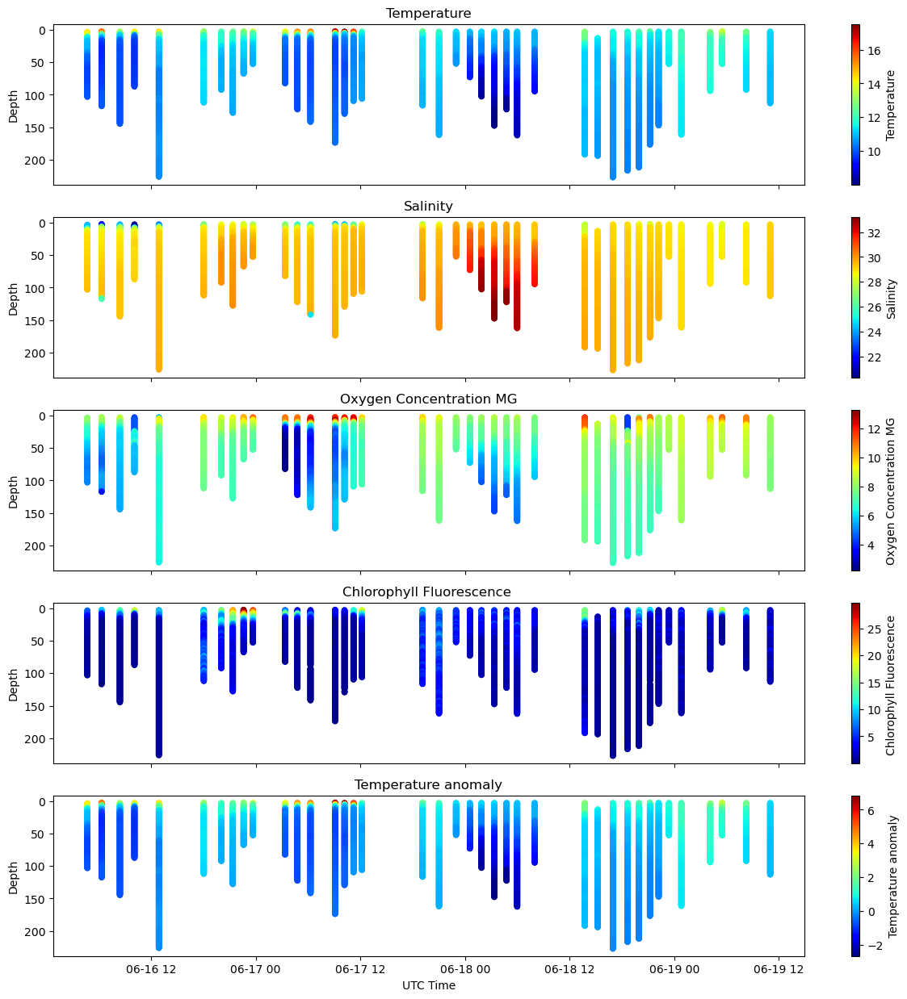

In [22]:
variables = ["Temperature", "Salinity", "Oxygen Concentration MG", "Chlorophyll Fluorescence ", "Temperature anomaly"]

fig, axes = plt.subplots(len(variables), 1, figsize=(15, 3*len(variables)), sharey=True, sharex=True)
for ax, var in zip(axes, variables):
    df.plot(y="Depth", x="UTC Time", c=var, kind="scatter", ax=ax, title=var, cmap="jet")
    ax.invert_yaxis()

### Default (viridis)

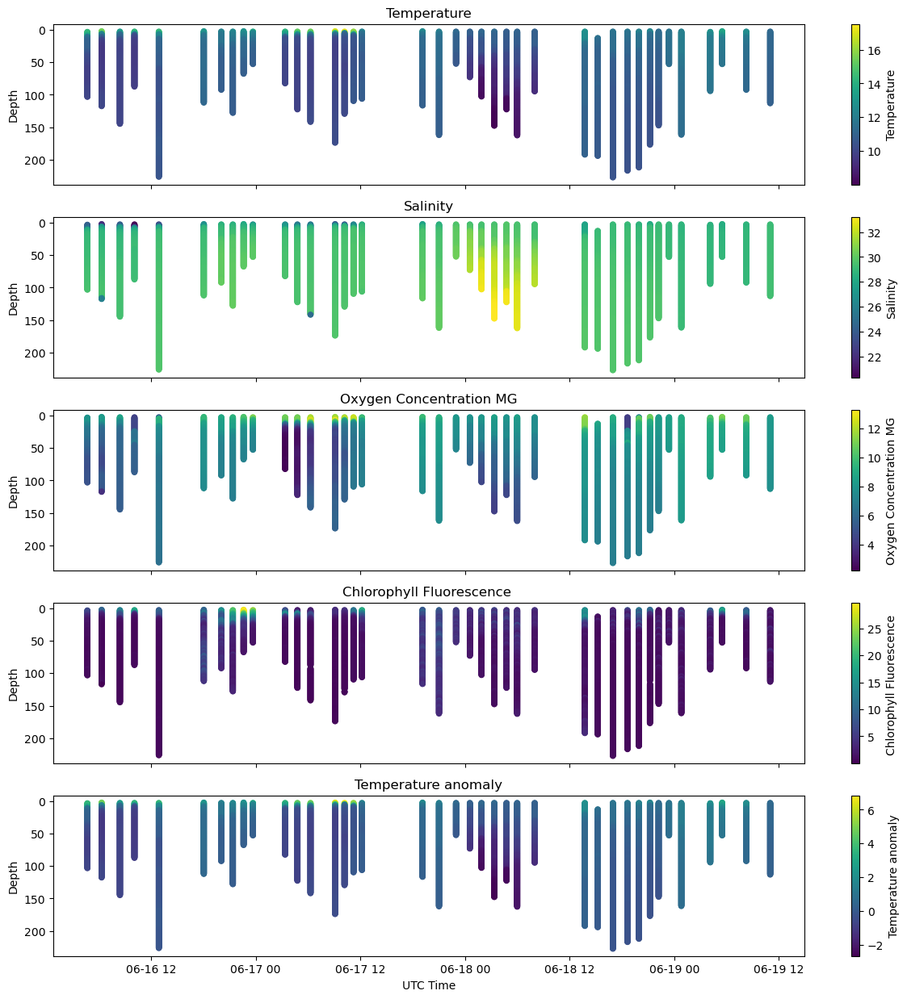

In [23]:
variables = ["Temperature", "Salinity", "Oxygen Concentration MG", "Chlorophyll Fluorescence ", "Temperature anomaly"]

fig, axes = plt.subplots(len(variables), 1, figsize=(15, 3*len(variables)), sharey=True, sharex=True)
for ax, var in zip(axes, variables):
    df.plot(y="Depth", x="UTC Time", c=var, kind="scatter", ax=ax, title=var)
    ax.invert_yaxis()

This is good, and perceptually uniform. But, using the same colormap for every variable means the viewer has to map different meaning to the same colors. In one case yellow means salty water which is deeper in the water column. But then it means warmer water at the surface. Using a single colormap also doesn't allow for matching the lightness to the variable properties, so all data here uses a sequential colormap whether or not it is the best choice.

### Purposeful colormap selections

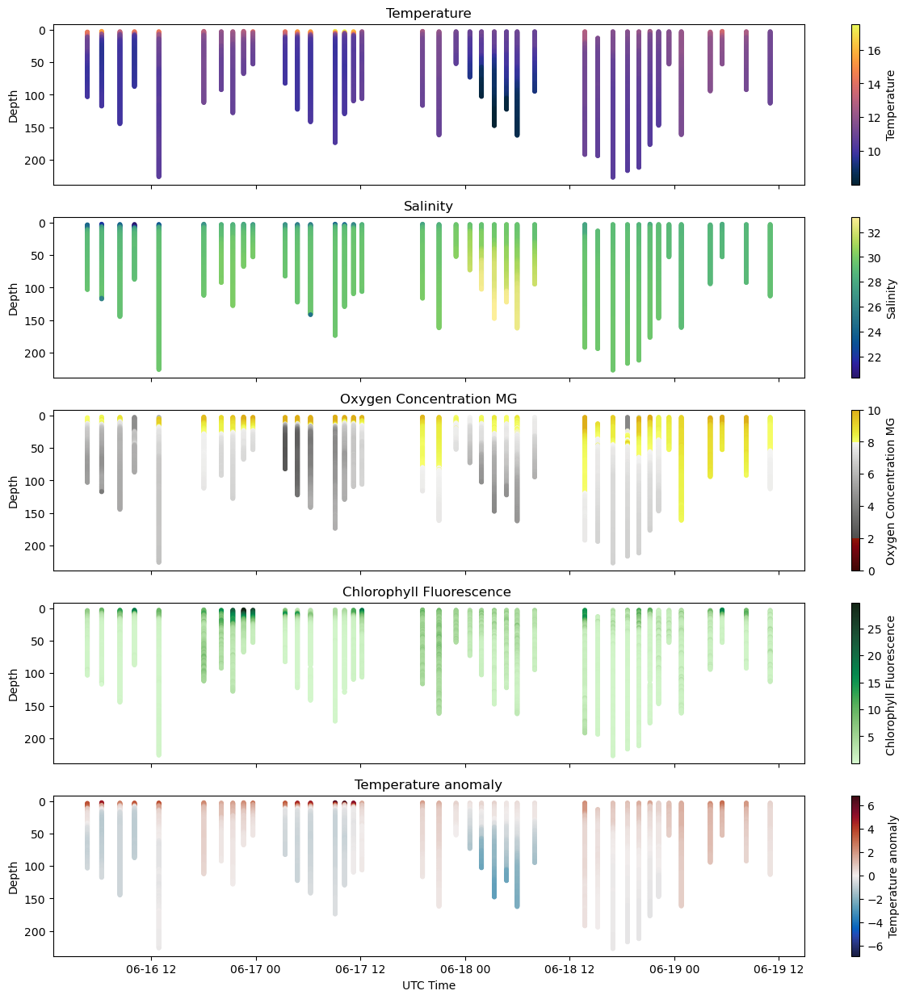

In [24]:
variables = ["Temperature", "Salinity", "Oxygen Concentration MG", "Chlorophyll Fluorescence ", "Temperature anomaly"]
cmaps = [cmo.thermal, cmo.haline, cmo.oxy, cmo.algae, cmo.balance]
fig, axes = plt.subplots(len(variables), 1, figsize=(15, 3*len(variables)), sharey=True, sharex=True)
for ax, var, cmap in zip(axes, variables, cmaps):
    if var == "Temperature anomaly":
        vmax = max(abs(df[var].min()), abs(df[var].max()))
        vmin = -vmax
    elif var == "Oxygen Concentration MG":
        vmin = 0
        vmax = 10
    else:
        vmin = df[var].min()
        vmax = df[var].max()

    df.plot(y="Depth", x="UTC Time", c=var, kind="scatter", ax=ax, title=var, cmap=cmap, vmin=vmin, vmax=vmax, s=10)
    ax.invert_yaxis()

Here we have a specific colormap selected for each variable. For chlorophyll this is clearly intuitive for the variable, and for others where possible. If we want to present more data after this using the same variables, readers will already be accustomed to the colors and what they represent.

## Summary

* Use perceptually uniform colormaps to avoid creating artificial features in your data
* Match your colormap to your data in terms of lightness (sequential vs. diverging vs. cyclic) and intuition (e.g. use greens for chlorophyll)
* Consider colorblindness and avoid colormaps with red and green together since that is the most common color blindess

# Plotting on the Earth: Projections



Because the Earth (approximately) a sphere instead of a flat map, we introduce error into locations on the Earth whenever we flatten them to plot. There are lots of ways to approximate location on the planet with other numbers besides latitude and longitude; these are called projections. Each projection is imperfect in different ways, but also does something well. [For example](https://en.wikipedia.org/wiki/Map_projection):

Some projections — called equidistant projections – preserve distance, such as the azimuthal equidistant projection.

Other projections – equal-area – preserve area, such as Lambert azimuthal equal-area

Also conformal projections which preserve angles locally and local scale, like Mercator.


So, when plotting position, you can either just plot the dataset alone using whatever coordinates given or you'll have to worry about it if you want to plot with other datasets, like maps, or want your data to be presented in a non-distorted way, especially if it is in the upper or lower parts of the Earth where there is more longitude/latitude distortion.

Another reason using a projection helps is it will improve the aspect ratio of your plot so it isn't skewed.

## Static plot example

I'm using an epic old animation script as an example but pared down: https://github.com/kthyng/txla_plots/blob/master/plot_movie_salt.py

Here is the full animation from which I took the plot:
https://drive.google.com/open?id=1-T6N4_aAa4KcYxhzw9E1v7tuxBui_VYT&usp=drive_fs


We'll use example ROMS output that is from the same model to demo plotting on a map

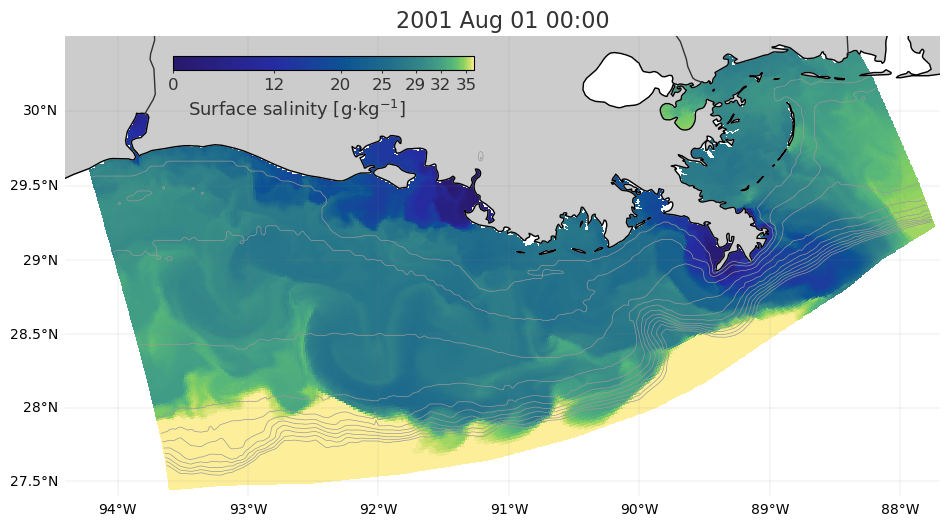

In [27]:
'''
Make salinity plots for movies of the full domain.

To be run in Python 3.
'''




def calc_cmap(cmap=cmo.haline, levels=(37-np.exp(np.linspace(0,np.log(36.), 10)))[::-1]-1):
    '''
    Colormap for salinity for river plumes, with bigger chunks of salinity per color
    section at lower salinity than higher.
    Help from http://wiki.scipy.org/Cookbook/Matplotlib/Show_colormaps

    Kristen Thyng, Feb 2014

    Inputs:
        cmap        Colormap name to use, e.g. 'YlGnBu'
        levels      edges of colors, as in contourf, to stretch
                    colormap. e.g. for salinity
                    levels = (37-exp(linspace(0,log(36.), 10)))[::-1]-1

    Outputs:
        my_cmap     colormap instance
    '''

    N = levels.size

    # Colors on either side of the edges
    rgb0 = plt.get_cmap(cmap)( np.linspace(0.0, 1.0, N) )[:,0:3]

    red = np.vstack((levels/levels.max(),
                    rgb0[:,0],
                    rgb0[:,0])).T
    red = tuple(map(tuple, red))

    green = np.vstack((levels/levels.max(),
                    rgb0[:,1],
                    rgb0[:,1])).T
    green = tuple(map(tuple, green))

    blue = np.vstack((levels/levels.max(),
                    rgb0[:,2],
                    rgb0[:,2])).T
    blue = tuple(map(tuple, blue))

    cdict = {'red':red, 'green':green, 'blue':blue}
    my_cmap = colors.LinearSegmentedColormap('my_colormap', cdict, 256)

    return my_cmap



hlevs = [10, 20, 50, 100, 150, 200, 250, 300, 350, 400, 450]  # isobath contour depths



# Colormap for model output
levels = (37-np.exp(np.linspace(0,np.log(37.), 10)))[::-1] # log for salinity, 0 to 36
levels[0] = 0
cmap = calc_cmap(cmo.haline, levels)
ilevels = [0,1,2,3,4,5,8] # which levels to label
ticks = [int(tick) for tick in levels[ilevels]] # plot ticks
##

var = 'salt'

land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                        edgecolor='face',
                                        facecolor=cfeature.COLORS['land'])
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')


m = xr.tutorial.open_dataset("ROMS_example")
# Time period to use
plotdate = m['ocean_time'].isel(ocean_time=0)


# Rename for convenience
lon_rho = m['lon_rho'][:].data
lat_rho = m['lat_rho'][:].data


# Set up plot
fig = plt.figure(figsize=(9.4, 7.7), dpi=100)
ax = fig.add_axes([0.06, 0.01, 0.93, 0.95], projection=ccrs.Mercator(central_longitude=-85.0))
ax.set_frame_on(False) # kind of like it without the box
ax.set_extent([-94.4, -87.7, 27.4, 30.5], ccrs.PlateCarree())
gl = ax.gridlines(linewidth=0.2, color='gray', alpha=0.5, linestyle='-', draw_labels=True)
# the following two make the labels look like lat/lon format
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.top_labels = False  # Disable labels on the top edge
gl.right_labels = False  # Disable labels on the right edge

# plot isobaths
ax.contour(lon_rho, lat_rho, m.h, hlevs, colors='0.6', transform=ccrs.PlateCarree(), linewidths=0.5)

# Date
datestr = pd.to_datetime(plotdate.data).strftime('%Y %b %d %H:%M')


# Plot surface salinity
plot_kwargs = {'x': 'lon_rho', 'y': 'lat_rho', 'cmap': cmap, 'vmin': 0, 'vmax': 36,
               'transform': ccrs.PlateCarree(), 'add_colorbar': False}#, "title": datestr}
mappable = m.salt.sel(ocean_time=plotdate).isel(s_rho=-1).plot(**plot_kwargs)
ax.set_title(datestr, fontsize=16, color='0.2')#, loc='left')

## Cartopy map features!!!
ax.add_feature(land_10m, facecolor='0.8')
ax.coastlines(resolution='10m')  # coastline resolution options are '110m', '50m', '10m'
ax.add_feature(states_provinces, edgecolor='0.2')
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='0.2')

# Colorbar in upper left corner
cax = fig.add_axes([0.175, 0.74, 0.32, 0.018]) #colorbar axes
cb = fig.colorbar(mappable, cax=cax, orientation='horizontal')
cb.set_label(r'Surface salinity [g$\cdot$kg$^{-1}$]          ', fontsize=13, color='0.2')
cb.ax.tick_params(labelsize=12, length=2, color='0.2', labelcolor='0.2')
cb.set_ticks(ticks)
# change colorbar tick color http://stackoverflow.com/questions/9662995/matplotlib-change-title-and-colorbar-text-and-tick-colors
cbtick = plt.getp(cb.ax.axes, 'yticklabels')
plt.setp(cbtick, color='0.2')


## Interactive plot example

In [28]:
import hvplot.xarray  # noqa

m.salt.sel(ocean_time=plotdate).isel(s_rho=-1).hvplot.quadmesh('lon_rho', 'lat_rho', cmap=cmap, clim=(0, 36),
                                                               tiles=True, geo=True, project=ccrs.PlateCarree(),
                                                               hover=True, title=f"{datestr} Surface Salinity [g/kg]")

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .QuadMesh.I :QuadMesh   [lon_rho,lat_rho]   (salinity)

## Summary

When you are plotting on the Earth, consider the projection to use and what properties you want it to have. Also consider what context your need — coastline, land, political boundaries, etc.

# Miscellaneous tips

* include context when possible
  * map, land, coastline, political boundaries
  * data that impact the main plot (precipitation, river flow)
* if plots will be used for an animation, set the colorbar range fixed so different times can be compared to one another and the colorbar doesn't jump around which is distracting
* don't try to have one plot do too much if it will overwhelm the viewer
* Try to make your figures as obvious and intuitive as possible. The less the viewer needs to look at the colorbar to map back and forth or have question, the better.
* If you want people to be able to read values off a plot:
  * add labeled contours
  * use a discrete instead of continuous colorbar
  * use an interactive plot with hover